In [ ]:
%pip install -r requirements.txt

In [2]:
import random
import matplotlib
import numpy as np
import pandas as pd
import seaborn as sns
import seaborn_image as isns

from tqdm import tqdm
import matplotlib.pyplot as plt
from IPython.display import HTML
from matplotlib import animation, colors

# increase mem limit
matplotlib.rcParams['animation.embed_limit'] = 2**128

In [3]:
from grid import Grid
from state import State

%load_ext autoreload
%autoreload 2

Grid shape (180, 180)


100%|██████████| 10000/10000 [00:00<00:00, 68488.38it/s]


Created 10000 particles, 5 infected


  0%|          | 0/100 [00:00<?, ?it/s]

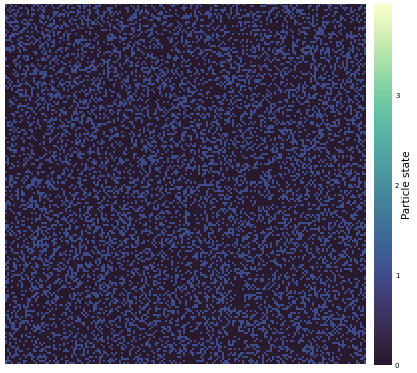

In [4]:
nrows = 180
ncols = 180
n_frames = 100
lock_a = 0
lock_dur = 0

g = Grid(nrows, ncols, num_part=10000, init_infected=5, 
            infectious_radius=1, lockdown_at=lock_a, 
            tp_chance=0.3, lockdown_dur=lock_dur)

fig, ax = plt.subplots(figsize=(10,10), dpi=50)

plt.ion()  
im = isns.imgplot(g.grid, origin="lower", ax=ax, vmin=0, vmax=State.max_value(), 
        cmap="deep", cbar_label="Particle state", despine=True,
        cbar_ticks=range(State.max_value()))
    
def init():
    im.images[0].set_data(np.zeros((nrows, ncols)))
    g.make_simulation(n_frames)

def animate(i):
    im.images[0].set_data(g.history[i])
    im.set(title = f'CA simulation, day {i+1}',)
    return im

anim = animation.FuncAnimation(fig, animate, init_func=init, 
                                frames=tqdm(range(n_frames)), interval=250)

In [6]:
HTML(anim.to_jshtml())

Simulating for 100 days...


100%|██████████| 100/100 [00:04<00:00, 22.44it/s]


Generating sim. stats...


 99%|█████████▉| 99/100 [01:08<00:00,  1.98it/s]

[Text(0.5, 1.0, 'CA model'), Text(0.5, 0, 'Days'), Text(0, 0.5, 'Population')]

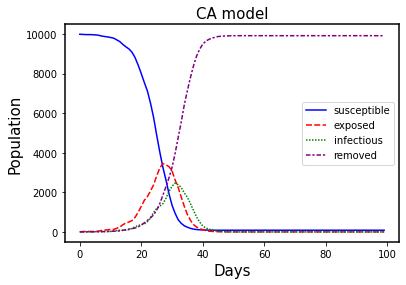

In [7]:
color_list = ["blue","red","green","purple"]
cmap = colors.LinearSegmentedColormap.from_list("", color_list)
sns.lineplot(data=g.pd_stats,palette=color_list ).set(title = 'CA model', xlabel = 'Days', ylabel = 'Population')